# Overview

About this project its still currently in progress, im trying the [CelebFaces Attributes Dataset](https://www.kaggle.com/datasets/jessicali9530/celeba-dataset/data) for my reference also from some code in kaggle. Im still lost in why i get my val_acc so low, i will try updating this as soon as possible.

If you have any error like i encounter (in my case im running this on jupyter notebook vscode by local )
- if its error telling about tensorRT : you should adjust your keras version into 2.13.1 and Tensorflow into 2.13.0
- if somehow your gpu not working : i recomend you to install tensorflow-gpu =2.8.0


In [1]:
!kaggle datasets download -d jessicali9530/celeba-dataset

100%|█████████████████████████████████████▉| 1.33G/1.33G [01:30<00:00, 20.3MB/s]
100%|██████████████████████████████████████| 1.33G/1.33G [01:30<00:00, 15.8MB/s]


In [5]:
!unzip celeba-dataset.zip -d data_input

Archive:  celeba-dataset.zip
  inflating: data_input/img_align_celeba/img_align_celeba/000001.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000002.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000003.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000004.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000005.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000006.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000007.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000008.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000009.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000010.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000011.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000012.jpg  
  inflating: data_input/img_align_celeba/img_align_celeba/000013.jpg  
  inflating: data_input/img_align_celeba/img_ali

In [36]:
import os 
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2

# for image
from PIL import Image
from io import BytesIO
import matplotlib.image as mpimg


warnings.filterwarnings('ignore')

In [35]:
# using inception v3 model
from tensorflow import keras 
from keras.applications.inception_v3 import InceptionV3
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

from keras import utils


# Content

A popular component of computer vision and deep learning revolves around identifying faces for various applications from logging into your phone with your face or searching through surveillance images for a particular suspect. This dataset is great for training and testing models for face detection, particularly for recognising facial attributes such as finding people with brown hair, are smiling, or wearing glasses. Images cover large pose variations, background clutter, diverse people, supported by a large quantity of images and rich annotations. This data was originally collected by researchers at MMLAB, The Chinese University of Hong Kong (specific reference in Acknowledgment section).

## Overall

202,599 number of face images of various celebrities
10,177 unique identities, but names of identities are not given
40 binary attribute annotations per image
5 landmark locations


- **img_align_celeba.zip**: All the face images, cropped and aligned

- **list_eval_partition.csv**: Recommended partitioning of images into training, validation, testing sets. Images 1-162770 are training, 162771-182637 are validation, 182638-202599 are testing
- **list_bbox_celeba.csv**: Bounding box information for each image. "x_1" and "y_1" represent the upper left point coordinate of bounding box. "width" and "height" represent the width and height of bounding box
- **list_landmarks_align_celeba.csv**: Image landmarks and their respective coordinates. There are 5 landmarks: left eye, right eye, nose, left mouth, right mouth
- **list_attr_celeba.csv**: Attribute labels for each image. There are 40 attributes. "1" represents positive while "-1" represents negative


## Inspiration

- Can you train a model that can detect particular facial attributes?
- Which images contain people that are smiling?
- Does someone have straight or wavy hair?

In [4]:
# read the data

data = pd.read_csv('./data_input/list_attr_celeba.csv')
data.head()

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [5]:
data_two = pd.read_csv('./data_input/list_bbox_celeba.csv')
data_two.head()

,image_id,x_1,y_1,width,height
0,000001.jpg,95,71,226,313
1,000002.jpg,72,94,221,306
2,000003.jpg,216,59,91,126
3,000004.jpg,622,257,564,781
4,000005.jpg,236,109,120,166


In [6]:
data_three = pd.read_csv('./data_input/list_eval_partition.csv')
data_three.head()

,image_id,partition
0,000001.jpg,0
1,000002.jpg,0
2,000003.jpg,0
3,000004.jpg,0
4,000005.jpg,0


In [7]:
data_four = pd.read_csv('./data_input/list_landmarks_align_celeba.csv')
data_four.head()

,image_id,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
0,000001.jpg,69,109,106,113,77,142,73,152,108,154
1,000002.jpg,69,110,107,112,81,135,70,151,108,153
2,000003.jpg,76,112,104,106,108,128,74,156,98,158
3,000004.jpg,72,113,108,108,101,138,71,155,101,151
4,000005.jpg,66,114,112,112,86,119,71,147,104,150


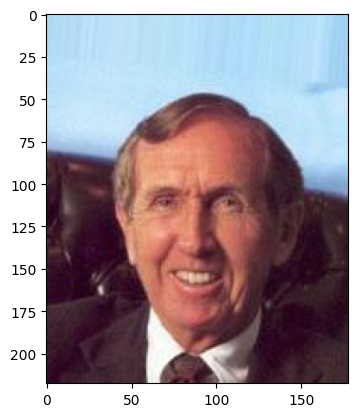

In [8]:
pic = './data_input/img_align_celeba/img_align_celeba/000021.jpg'
img = mpimg.imread(pic)
imgplot = plt.imshow(img)
plt.show()

In [9]:
data.columns

Index(['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young'],
      dtype='object')

In [10]:
# preprocessing

data_pro = data.set_index('image_id')
data_pro = data_pro.replace(to_replace = -1, value=0)
data_pro.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
image_id,,,,,,,,,,,,,,,,,,,,,
000001.jpg,0,1,1,0,0,0,0,0,0,0,...,0,1,1,0,1,0,1,0,0,1
000002.jpg,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
000003.jpg,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1
000004.jpg,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,1,0,1
000005.jpg,0,1,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1


here a value of 1 can be interpreted as 'yes,' indicating the presence of a male face in the image, while 0 represents 'no,' indicating the presence of a female face.

In [11]:
gender = data_pro[['Male']]
gender.head(10)

,Male
image_id,
000001.jpg,0
000002.jpg,0
000003.jpg,1
000004.jpg,0
000005.jpg,0
000006.jpg,0
000007.jpg,1
000008.jpg,1
000009.jpg,0


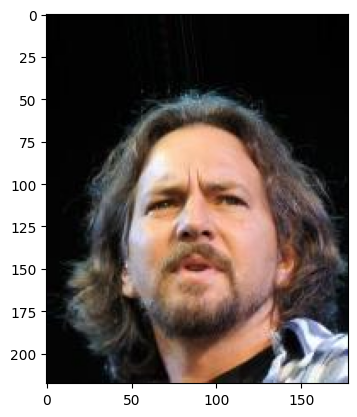

In [12]:
# see male pictures

img = mpimg.imread('./data_input/img_align_celeba/img_align_celeba/000020.jpg')
imgplot = plt.imshow(img)
plt.show()

# show the image and corresponding label
# gender.loc['./data_input/img_align_celeba/img_align_celeba/000020.jpg'.split('/')[-1]][['Male']]


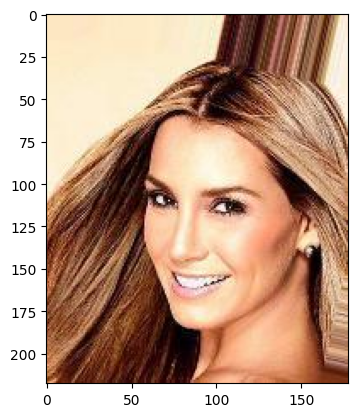

In [13]:
img2 = mpimg.imread('./data_input/img_align_celeba/img_align_celeba/000001.jpg')
imgplot2 = plt.imshow(img2)
plt.show()
# show the female picture and the corresponding label

# gender.loc['./data_input/img_align_celeba/img_align_celeba/000001.jpg'.split('/')[-1]][['Male']]

In [14]:
gender.head()

,Male
image_id,
000001.jpg,0
000002.jpg,0
000003.jpg,1
000004.jpg,0
000005.jpg,0


In [15]:
gender.value_counts()

Male
0       118165
1        84434
Name: count, dtype: int64

In [16]:
data_par = data_three.set_index('image_id')
data_par.head()

,partition
image_id,
000001.jpg,0
000002.jpg,0
000003.jpg,0
000004.jpg,0
000005.jpg,0


In [17]:
data_merge = gender.merge(data_par['partition'], left_index=True, right_index=True)
data_merge.head()

,Male,partition
image_id,,
000001.jpg,0,0
000002.jpg,0,0
000003.jpg,1,0
000004.jpg,0,0
000005.jpg,0,0


In [18]:
data = gender.merge(data_par['partition'], left_index = True, right_index = True)
data

,Male,partition
image_id,,
000001.jpg,0,0
000002.jpg,0,0
000003.jpg,1,0
000004.jpg,0,0
000005.jpg,0,0
...,...,...
202595.jpg,0,2
202596.jpg,1,2
202597.jpg,1,2


In [19]:
images_folder = './data_input/img_align_celeba/img_align_celeba/'

TRAINING_SAMPLES = 10000
VALIDATION_SAMPLES = 2000
TEST_SAMPLES = 2000
BATCH_SIZE = 16

IMG_WIDTH = 178
IMG_HEIGHT = 218

In [20]:
def load_reshape_img(fname):
    img = load_img(fname)
    x = img_to_array(img)/255.
    x = x.reshape((1,) + x.shape)

    return x

# generating datasets
def generator(partition, attribute, num_samples):
    # df_ = data_merge(data_merge['partition'] == partition) & (data_merge[attribute]== 0).sample(int(num_samples/2))
    # df_ = pd.concat([df_, data_merge[(data_merge['partition']== partition) & (data_merge[attribute] == 1)].sample(int(num_samples/2))])

    df_ = data[(data['partition'] == partition) 
                           & (data[attribute] == 0)].sample(int(num_samples/2))
    df_ = pd.concat([df_,
                      data[(data['partition'] == partition) 
                                  & (data[attribute] == 1)].sample(int(num_samples/2))])
    # if partition != 2:
    #     x_ = np.array([load_reshape_img(images_folder + fname) for fname in df_.index])
    #     x_ = x_.reshape(x_.shape[0], IMG_HEIGHT, IMG_WIDTH, 3)
    #     y_ = np_utils.to_categorical(df_[attribute],2)

    if partition != 2:
        
        # Loading images and storing them in the 'x_' array
        x_ = np.array([load_reshape_img(images_folder + fname) for fname in df_.index])
        x_ = x_.reshape(x_.shape[0], 218, 178, 3)
        
        # Storing target variable in the 'y_' array
        y_ = to_categorical(df_[attribute],2)
    
    else:
        x_ = []
        y_ = []

        for index, target in df_.iterrows():
            
            # Taking images as input and resizing
            im = cv2.imread(images_folder + index)
            im = cv2.resize(cv2.cvtColor(im, cv2.COLOR_BGR2RGB), (IMG_WIDTH, IMG_HEIGHT)).astype(np.float32) / 255.0
            im = np.expand_dims(im, axis =0)
            x_.append(im) # Storing in normalized images
            y_.append(target[attribute]) # Storing in the target variable

    return x_, y_


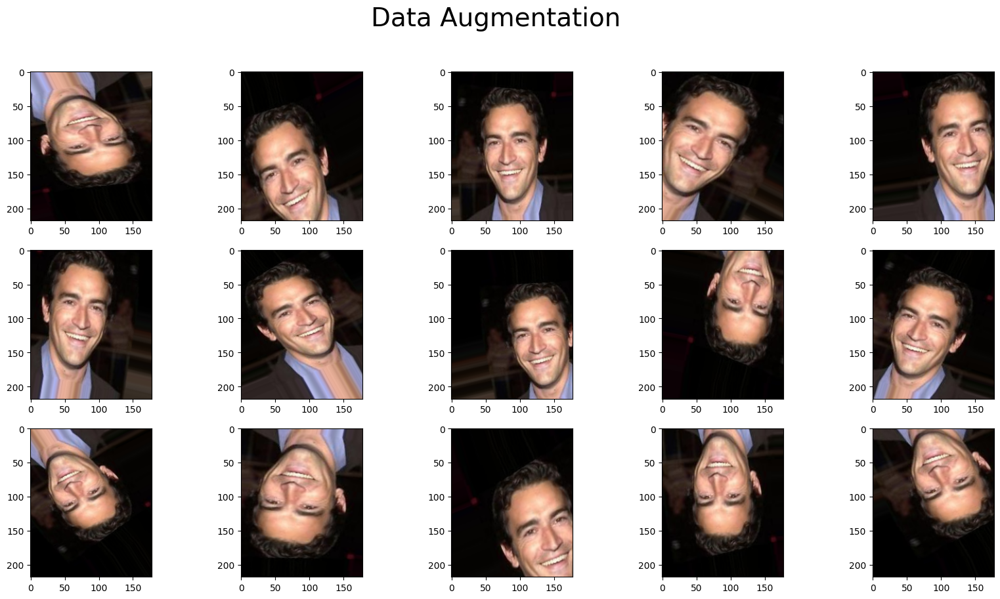

In [21]:
# Data augmentation

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2, # shear transformation
    zoom_range=0.2, # zoom transformation
    horizontal_flip=True,
    vertical_flip=True,)

# Example image

img = load_img('./data_input/img_align_celeba/img_align_celeba/000050.jpg')
x = img_to_array(img)/255.
x = x.reshape((1,) + x.shape)

# plot for data augmentation
plt.figure(figsize=(20,10))
plt.suptitle('Data Augmentation', fontsize=28)

i = 0 
# for batch in datagen.flow(x, batch_size=1):
#     plt.subplot(3,5,i+1)
#     plt.grid(False)
#     plt.imshow(batch.reshape(IMG_HEIGHT, IMG_WIDTH, 3))
#     i += 1
#     if i % 15 == 0:
#         break
        
for batch in datagen.flow(x, batch_size = 1):
    plt.subplot(3, 5, i + 1)
    plt.grid = (False)
    plt.imshow(batch.reshape(218, 178, 3))
    
    if i == 14:
        break
    i += 1
plt.show()

In [34]:
from keras.utils import to_categorical
from keras.optimizers import SGD
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.applications.inception_v3 import preprocess_input
from sklearn.metrics import f1_score

In [23]:
# Train data
x_train, y_train = generator(0, 'Male', TRAINING_SAMPLES)

# Train - Data Augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function= preprocess_input,
    rotation_range = 30,
    width_shift_range= 0.2,   # randomly shift images horizontally (fraction of total width)
    height_shift_range= 0.2,  # randomly shift images vertically (fraction of total height)
    shear_range = 0.2,        # shear transformation
    zoom_range= 0.2,          # zoom transformation
    horizontal_flip= True,
)

train_datagen.fit(x_train)

train_generator = train_datagen.flow(
    x_train, y_train,
    batch_size= BATCH_SIZE
)
    

In [32]:
# Validation Data

x_valid, y_valid = generator(1,'Male',VALIDATION_SAMPLES)

In [37]:
inc_model = InceptionV3(weights='imagenet',
                        include_top=False,
                        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

print("number of layers:", len(inc_model.layers))

2023-11-08 11:12:01.688987: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-08 11:12:01.787846: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-08 11:12:01.788021: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

number of layers: 311


In [38]:
inc_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 218, 178, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 108, 88, 32)          864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 108, 88, 32)          96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 108, 88, 32)          0         ['batch_normalizati

In [39]:
x = inc_model.output
x=  GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

In [42]:
model_ = Model(inputs=inc_model.input, outputs=predictions)

# lock the initial layers of the model
for layer in model_.layers[:52]:
    layer.trainable = False

# compile the model
model_.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])


## Train the Model

In [43]:
checkpointer = ModelCheckpoint(filepath='model.weights.best.hdf5', verbose=1, save_best_only=True)

In [44]:
history = model_.fit_generator(train_generator,
                               validation_data=(x_valid, y_valid),
                               steps_per_epoch= TRAINING_SAMPLES / BATCH_SIZE,
                               epochs= 20,
                               callbacks=[checkpointer],
                               verbose=1,)

Epoch 1/20
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Unknown node type <gast.gast.Assign object at 0x7f2f55aad960>
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Unknown node type <gast.gast.Assign object at 0x7f2f55aad960>
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Unknown node type <gast.gast.Assign object at 0x7f2f55aad960>
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


2023-11-08 11:12:33.502050: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8902
2023-11-08 11:12:33.642149: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:231] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.9
2023-11-08 11:12:33.642168: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:234] Used ptxas at ptxas
2023-11-08 11:12:33.642213: W tensorflow/compiler/xla/stream_executor/gpu/redzone_allocator.cc:322] UNIMPLEMENTED: ptxas ptxas too old. Falling back to the driver to compile.
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-11-08 11:12:35.064266: W tensorflow/compiler/xla/service/gpu/llvm_gpu_backend/gpu_backend_lib.cc:521] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched 

625/625 [==============================] - ETA: 0s - loss: 0.6519 - accuracy: 0.6080WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7f2f555a1990> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert

Epoch 1: val_loss improved from inf to 1.05770, saving model to model.weights.best.hdf5
625/625 [==============================] - 49s 60ms/step - loss: 0.6519 - accuracy: 0.6080 - val_loss: 1.0577 - val_accuracy: 0.4995
Epoch 2/20
625/625 [==============================] - ETA: 0s - loss: 0.5027 - accuracy: 0.7473
Epoch 2: val_loss did not improve from 1.05770
625/625 [==============================] - 34s 55ms/step - loss: 0.5027 - accuracy: 0.7473 - val_loss: 1.2308 - val_accuracy: 0.4995
Epoch 3/20
625/625 [==============================] - ETA: 0s - loss: 0.4349 - accuracy: 0.7966
Epoch 3: val_loss did not improve from 1.05770
625/625 [=======

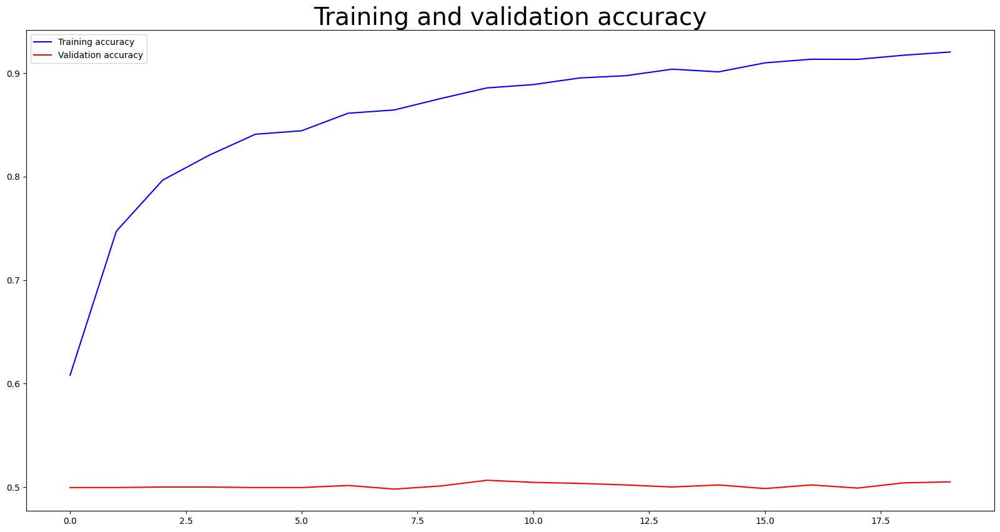

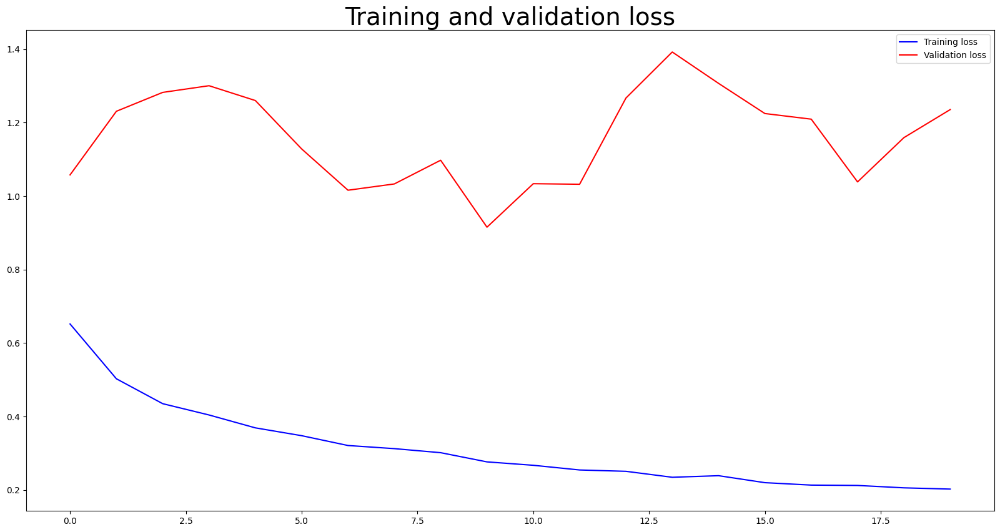

In [45]:
# visualize the training process

def plot_training(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    epochs = range(len(acc))
    plt.figure(figsize=(20,10))
    plt.plot(epochs, acc, 'b', label='Training accuracy')
    plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
    plt.title('Training and validation accuracy', fontsize=28)
    plt.legend(loc=0)
    plt.show()


# visualize the loss

def plot_training_loss(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(len(loss))
    plt.figure(figsize=(20,10))
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss', fontsize=28)
    plt.legend(loc=0)
    plt.show()

plot_training(history)
plot_training_loss(history)


In [46]:
# Model evaluation

model_.load_weights('model.weights.best.hdf5')

In [ ]:
# Test data
x_test, y_test = generator(2, 'Male', TEST_SAMPLES)

# Get predictions
model_pred = [np.argmax(model_.predict(feature)) for feature in x_test]

# Report test accuracy
test_accuracy = 100 * np.sum(np.array(model_pred)== y_test/len(model_pred))
print('Test accuracy: %.4f%%' % test_accuracy)
print('f1+score: %.4f%%' % f1_score(y_test, model_pred, average='macro'))

In [48]:
#dictionary to name the prediction
gender_target = {0: 'Female'
                , 1: 'Male'}

def img_to_display(filename):
    # inspired on this kernel:
    # https://www.kaggle.com/stassl/displaying-inline-images-in-pandas-dataframe
    # credits to stassl :)
    
    i = Image.open(filename)
    i.thumbnail((200, 200), Image.LANCZOS)
    
    with BytesIO() as buffer:
        i.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()
    

def display_result(filename, prediction, target):
    gender = 'Male'
    gender_icon = "https://png.pngtree.com/png-clipart/20190705/original/pngtree-man-avatar-icon-professional-man-character-png-image_4356027.jpg"
        
    if prediction[1] <= 0.5:
        gender_icon = "https://png.pngtree.com/png-clipart/20190614/original/pngtree-female-avatar-vector-icon-png-image_3725439.jpg"
        gender = 'Female'
            
    display_html = '''
    <div style="overflow: auto;  border: 2px solid #D8D8D8;
        padding: 5px; width: 480px;" >
        <img src="data:image/jpeg;base64,{}" style="float: left;" width="200" height="200">
        <div style="padding: 10px 0px 0px 20px; overflow: auto;">
            <img src="{}" style="float: left;" width="40" height="40">
            <h3 style="margin-left: 50px; margin-top: 2px;">Prediction: {}</h3>
            <p style="margin-left: 50px; margin-top: -6px; font-size: 12px">{} probability</p>
            <p style="margin-left: 50px; margin-top: -16px; font-size: 12px">Real gender: {}</p>
        </div>
    </div>
    '''.format(img_to_display(filename)
               , gender_icon
               , gender
               , "{0:.2f}%".format(round(max(prediction)*100,2))
               , gender_target[target]
               , filename.split('/')[-1]
               )

    display(HTML(display_html))


In [49]:
def gender_prediction(filename):
    im = cv2.imread(filename)
    im = cv2.resize(cv2.cvtColor(im, cv2.COLOR_BGR2RGB), (IMG_WIDTH, IMG_HEIGHT)).astype(np.float32) / 255.0
    im = np.expand_dims(im, axis =0)

# prediction
    result = model_.predict(im)
    prediction = np.argmax(result)
    
    return result

1/1 [==============================] - 0s 12ms/step



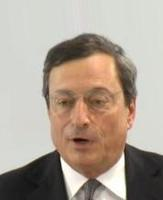

1/1 [==============================] - 0s 14ms/step



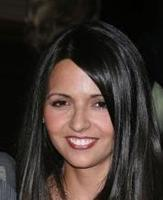

1/1 [==============================] - 0s 16ms/step



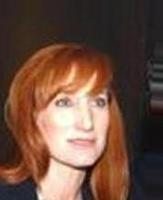

1/1 [==============================] - 0s 15ms/step



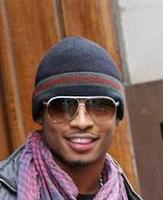

1/1 [==============================] - 0s 14ms/step



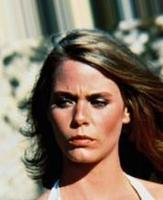

1/1 [==============================] - 0s 13ms/step



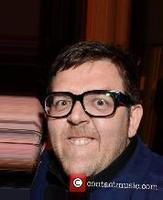

1/1 [==============================] - 0s 14ms/step



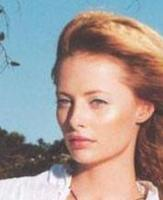

1/1 [==============================] - 0s 14ms/step



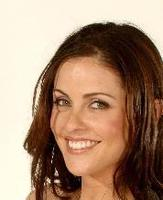

1/1 [==============================] - 0s 14ms/step



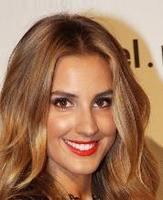

1/1 [==============================] - 0s 14ms/step



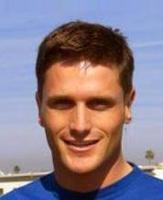

In [52]:
import base64
from IPython.core.display import display, HTML
from PIL import Image
from io import BytesIO
#select random images of the test partition
df_to_test = data_merge[(data_merge['partition'] == 2)].sample(10)

for index, target in df_to_test.iterrows():
    result = gender_prediction(images_folder + index)
    
    #display result
    display_result(images_folder + index, result[0], target['Male'])